# (23) MNIST—1

**Motivation**: Fit MNIST, fully conv enc + dec. Device = ```cuda:1``` <br>

In [1]:
# HIDE CODE


import os, sys
from IPython.display import display

# tmp & extras dir
git_dir = os.path.join(os.environ['HOME'], 'Dropbox/git')
extras_dir = os.path.join(git_dir, 'jb-vae/_extras')
fig_base_dir = os.path.join(git_dir, 'jb-vae/figs')
tmp_dir = os.path.join(git_dir, 'jb-vae/tmp')

# GitHub
sys.path.insert(0, os.path.join(git_dir, '_PoissonVAE'))
from analysis.eval import sparse_score
from figures.fighelper import *
from vae.train_vae import *

# warnings, tqdm, & style
warnings.filterwarnings('ignore', category=DeprecationWarning)
from rich.jupyter import print
%matplotlib inline
set_style()

In [2]:
device_idx = 1
device = f'cuda:{device_idx}'

model_type = 'poisson'

## CONV + FF

In [3]:
cfg_vae, cfg_tr = default_configs('MNIST')
cfg_tr['warm_restart'] = 1
cfg_tr['epochs'] = 1200
cfg_tr['lr'] = 8e-4

print(f"VAE:\n{cfg_vae}\n\nTrainer:\n{cfg_tr}")

VAE:
{'dataset': 'MNIST', 'prior_clamp': -3.0, 'prior_log_dist': 'uniform', 'init_scale': 0.05, 'rmax_q': 1.0, 
'n_latents': 10, 'enc_type': 'conv', 'dec_type': 'conv', 'enc_bias': True, 'dec_bias': True, 'weight_norm': False}

Trainer:
{'method': 'mc', 'kl_beta': 1.0, 'kl_anneal_portion': 0.5, 'lambda_anneal': True, 'lambda_init': 0.0, 
'lambda_norm': 0.0, 'temp_anneal_portion': 0.5, 'temp_anneal_type': 'lin', 'temp_start': 1.0, 'temp_stop': 0.05, 
'lr': 0.0008, 'epochs': 1200, 'batch_size': 200, 'optimizer_kws': {'weight_decay': 0.0005}, 'grad_clip': 1000, 
'warm_restart': 1}

+-------------+------------+
| Module Name | Num Params |
+-------------+------------+
|  PoissonVAE |  6.2 Mil   |
|     ---     |    ---     |
|     stem    |    352     |
|     enc     |  4.9 Mil   |
|    fc_enc   |   2.6 K    |
|    fc_dec   |   11.3 K   |
|     dec     |  1.2 Mil   |
+-------------+------------+

poisson_uniform_c(-3)_rmax(1)_MNIST_z-10_k-32_<conv+b|conv+b>
mc_b200-ep1200-lr(0.0008)_beta(1:0x0.5)_temp(0.05:lin-0.5)_gr(1000)_(2024_05_01,14:26)

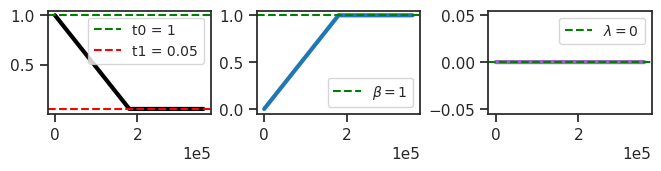

In [4]:
vae = MODEL_CLASSES[model_type](CFG_CLASSES[model_type](**cfg_vae))
tr = TrainerVAE(vae, ConfigTrainVAE(**cfg_tr), device=device)

vae.print()
print(f"{vae.cfg.name()}\n{tr.cfg.name()}_({vae.timestamp})\n")
tr.show_schedules()

In [5]:
print(vae)

PoissonVAE(
  (mse): MSELoss()
  (stem): Conv2D(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=valid)
  (enc): Sequential(
    (0): Cell(
      (skip): Identity()
      (ops): ModuleList(
        (0-1): 2 x ConvLayer(
          (act_fn): SiLU()
          (conv): Conv2D(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        )
      )
      (se): SELayer(
        (fc): Sequential(
          (0): Linear(in_features=32, out_features=4, bias=True)
          (1): ReLU(inplace=True)
          (2): Linear(in_features=4, out_features=32, bias=True)
          (3): Sigmoid()
        )
      )
    )
    (1): Cell(
      (skip): StrideReduce(
        (swish): SiLU()
        (conv): Conv2D(32, 64, kernel_size=(1, 1), stride=(2, 2))
      )
      (ops): ModuleList(
        (0): ConvLayer(
          (act_fn): SiLU()
          (conv): Conv2D(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
        )
        (1): ConvLayer(
          (act_fn): SiLU()
          (conv): Conv2D(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        )
      )
      (se): SELayer(
        (fc): Sequential(
          (0): Linear(in_features=64, out_features=4, bias=True)
          (1): ReLU(inplace=True)
          (2): Linear(in_features=4, out_features=64, bias=True)
          (3): Sigmoid()
        )
      )
    )
    (2): Cell(
      (skip): Identity()
      (ops): ModuleList(
        (0-1): 2 x ConvLayer(
          (act_fn): SiLU()
          (conv): Conv2D(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        )
      )
      (se): SELayer(
        (fc): Sequential(
          (0): Linear(in_features=64, out_features=4, bias=True)
          (1): ReLU(inplace=True)
          (2): Linear(in_features=4, out_features=64, bias=True)
          (3): Sigmoid()
        )
      )
    )
    (3): Cell(
      (skip): StrideReduce(
        (swish): SiLU()
        (conv): Conv2D(64, 128, kernel_size=(1, 1), stride=(2, 2))
      )
      (ops): ModuleList(
        (0): ConvLayer(
          (act_fn): SiLU()
          (conv): Conv2D(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
        )
        (1): ConvLayer(
          (act_fn): SiLU()
          (conv): Conv2D(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        )
      )
      (se): SELayer(
        (fc): Sequential(
          (0): Linear(in_features=128, out_features=8, bias=True)
          (1): ReLU(inplace=True)
          (2): Linear(in_features=8, out_features=128, bias=True)
          (3): Sigmoid()
        )
      )
    )
    (4): Cell(
      (skip): Identity()
      (ops): ModuleList(
        (0-1): 2 x ConvLayer(
          (act_fn): SiLU()
          (conv): Conv2D(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        )
      )
      (se): SELayer(
        (fc): Sequential(
          (0): Linear(in_features=128, out_features=8, bias=True)
          (1): ReLU(inplace=True)
          (2): Linear(in_features=8, out_features=128, bias=True)
          (3): Sigmoid()
        )
      )
    )
    (5): Cell(
      (skip): StrideReduce(
        (swish): SiLU()
        (conv): Conv2D(128, 256, kernel_size=(1, 1), stride=(2, 2))
      )
      (ops): ModuleList(
        (0): ConvLayer(
          (act_fn): SiLU()
          (conv): Conv2D(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
        )
        (1): ConvLayer(
          (act_fn): SiLU()
          (conv): Conv2D(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        )
      )
      (se): SELayer(
        (fc): Sequential(
          (0): Linear(in_features=256, out_features=16, bias=True)
          (1): ReLU(inplace=True)
          (2): Linear(in_features=16, out_features=256, bias=True)
          (3): Sigmoid()
        )
      )
    )
    (6): Cell(
      (skip): Identity()
      (ops): ModuleList(
        (0-1): 2 x ConvLayer(
          (act_fn): SiLU()
          (conv): Conv2D(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        )
      )
    

In [6]:
vae.fc_dec.bias.shape, vae.fc_enc.bias.shape

(torch.Size([1024]), torch.Size([10]))

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:1')

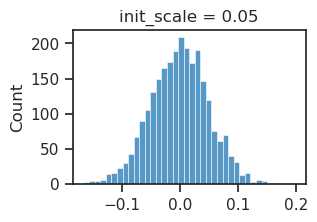

In [7]:
fig, ax = create_figure(figsize=(3, 2))
sns.histplot(to_np(vae.fc_enc.weight.data).ravel())
ax.set_title(f"init_scale = {vae.cfg.init_scale}")
vae.fc_enc.bias.data

## Train

In [ ]:
comment = f"initscale-0.05_warmrestart-1_{tr.cfg.name()}"
# comment = tr.cfg.name()
tr.train(comment=comment)

epoch # 474, avg loss: 30.404629:  40%|████████▋             | 474/1200 [1:26:34<2:09:15, 10.68s/it]

## Eval

### Loss vld (freeze)

In [ ]:
data, loss, etc = tr.validate()

_loss = {k: v.mean() for k, v in loss.items()}
_loss['tot'] = _loss['mse'] + _loss['kl']
print(_loss)

### Identify dead neurons

In [9]:
dead_thres = 0 # 0.002
dead = loss['kl_diag'] < dead_thres
dead.sum()

0

In [10]:
loss['kl_diag']

array([0.8811605 , 0.9564269 , 0.90161026, 0.9998836 , 0.8989125 ,
       0.88090116, 0.9528498 , 0.9213925 , 0.73042536, 0.9566365 ],
      dtype=float32)

### Spike counts

In [11]:
lifetime, population, percents = sparse_score(data['z'], cutoff=0.01)
percents

{'0': 52.0,
 '1': 13.0,
 '2': 11.8,
 '3': 9.3,
 '4': 6.2,
 '5': 3.8,
 '6': 1.9,
 '7': 1.0,
 '8': 0.5,
 '9+': 0.5}

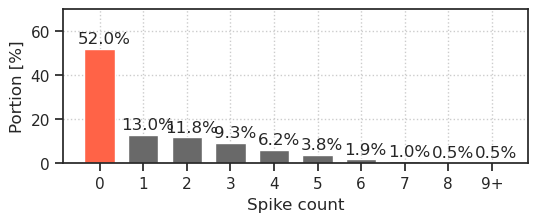

In [12]:
fig, ax = create_figure(1, 1, (6.0, 2.0))

max_val = float(list(percents.values())[0])
ax.set(
    xlabel='Spike count',
    ylabel='Portion [%]',
    ylim=(0, (np.ceil(max_val / 10) + 1) * 10),
)

colors = ['tomato' if lbl == '0' else 'dimgrey' for lbl in percents]
bars = ax.bar(percents.keys(), percents.values(), color=colors, width=0.7)

for bar in bars:
    y = bar.get_height()
    x = bar.get_x() + 1.3 * bar.get_width() / 2
    plt.text(x, y + 1, f'{y:0.1f}%', ha='center', va='bottom')

ax.locator_params(axis='y', nbins=5)

ax.grid()
plt.show()

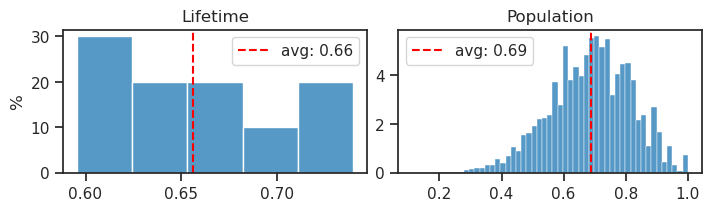

In [13]:
fig, axes = create_figure(1, 2, (7, 2), layout='constrained')

sns.histplot(lifetime, stat='percent', ax=axes[0])
sns.histplot(population, stat='percent', ax=axes[1])

for i, x2p in enumerate([lifetime, population]):
    _a, _med = np.nanmean(x2p), np.nanmedian(x2p)
    # axes[i].axvline(_med, color='g', ls='--', label=f'median: {_med:0.2f}')
    axes[i].axvline(_a, color='r', ls='--', label=f'avg: {_a:0.2f}')

add_legend(axes)
axes[0].set(title='Lifetime', ylabel='%')
axes[1].set(title='Population', ylabel='')
plt.show()

In [14]:
tot_nspks = data['z'][:, ~dead].sum(1)
tot_firing = (data['z'][:, ~dead] > 0).mean(1)

min(tot_nspks), max(tot_nspks)

(0.0, 47.0)

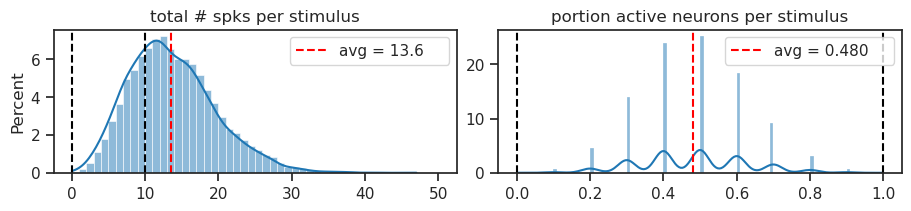

In [15]:
a = np.floor(min(tot_nspks) / 10) * 10
b = np.ceil(max(tot_nspks) / 10) * 10

fig, axes = create_figure(1, 2, (9, 2), layout='constrained')

sns.histplot(tot_nspks, bins=np.linspace(a, b, int(b - a) + 1), kde=True, stat='percent', ax=axes[0])
sns.histplot(tot_firing, bins=np.linspace(0, 1.0, 101), kde=True, stat='percent', ax=axes[1])

_a = tot_nspks.mean()
axes[0].axvline(_a, color='r', ls='--', label=f'avg = {_a:0.1f}    ')
_a = tot_firing.mean()
axes[1].axvline(_a, color='r', ls='--', label=f'avg = {_a:0.3f}    ')

axes[0].axvline(vae.cfg.n_latents, color='k', ls='--')
axes[1].axvline(1.0, color='k', ls='--')

axes[0].set_title('total # spks per stimulus')
axes[1].set(title='portion active neurons per stimulus', ylabel='')

for ax in axes.flat:
    ax.axvline(0, color='k', ls='--')
    ax.legend()
plt.show()

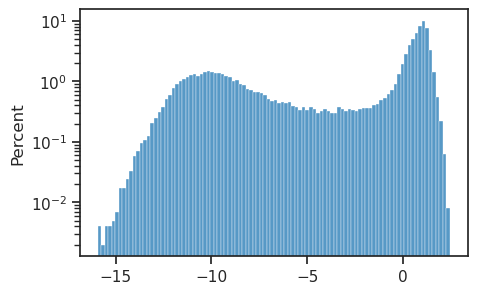

In [16]:
ax = sns.histplot(np.log(etc['r*dr'][:, ~dead].ravel()), stat='percent', bins=100)
ax.set_yscale('log')

### Some more distributions

In [17]:
tr.model.temp, tr.cfg.kl_beta

(tensor(0.0500, device='cuda:1'), 1.0)

In [18]:
prior_rates = to_np(vae.log_rates)[:, ~dead].ravel()

mu = prior_rates.mean()
sd = prior_rates.std()

rv = sp_stats.norm(loc=mu, scale=sd)
xs = np.linspace(-2.0, 2.0, 100)
pdf = rv.pdf(xs)

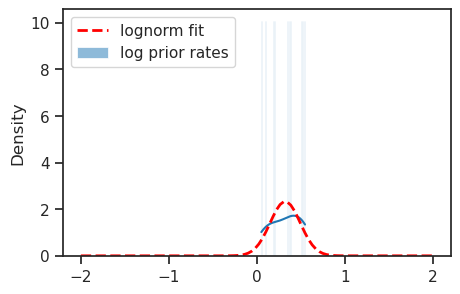

In [19]:
fig, ax = create_figure()

sns.histplot(prior_rates, stat='density', bins=50, kde=True, label='log prior rates', ax=ax)
ax.plot(xs, pdf, color='r', lw=2, ls='--', label='lognorm fit')
add_legend(ax)
plt.show()

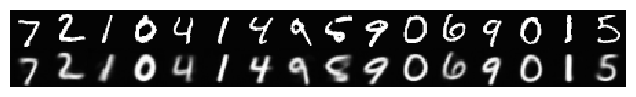

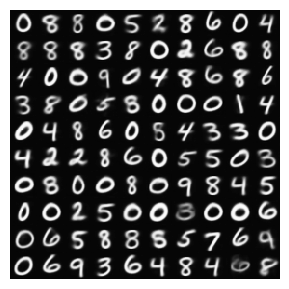

In [16]:
tr.show_recon(0.0), tr.show_samples(0.0);

In [17]:
def _show_pairwise(i, j):
    df = pd.DataFrame({
        f'z-{i}': etc['r*dr'][:, i],
        f'z-{j}': etc['r*dr'][:, j],
        f'z-{i}_log': np.log(etc['r*dr'][:, i]),
        f'z-{j}_log': np.log(etc['r*dr'][:, j]),
        'lbl': tr.dl_vld.dataset.tensors[1],
    })
    fig, axes = create_figure(1, 2, (8, 4.5), layout='constrained')
    sns.scatterplot(data=df, x=f'z-{i}', y=f'z-{j}', hue='lbl', palette='tab10', s=20, ax=axes[0])
    sns.scatterplot(data=df, x=f'z-{i}_log', y=f'z-{j}_log', hue='lbl', palette='tab10', s=5, legend=False, ax=axes[1])
    axes[1].axvline(0, color='k', ls='--', lw=1.0, zorder=0)
    axes[1].axhline(0, color='k', ls='--', lw=1.0, zorder=0)
    ax_square(axes)
    plt.show()

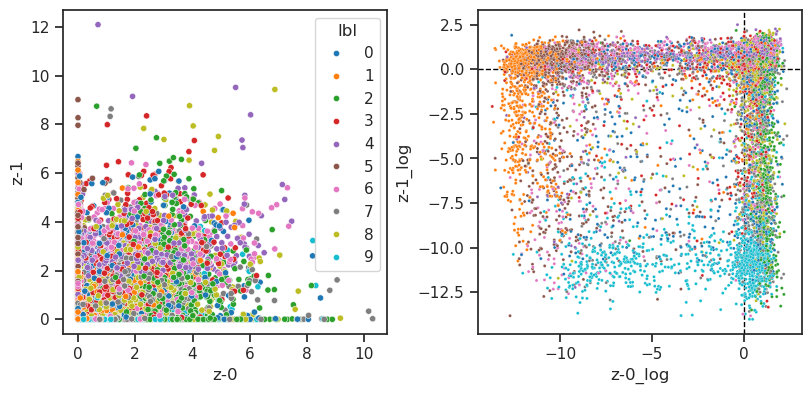

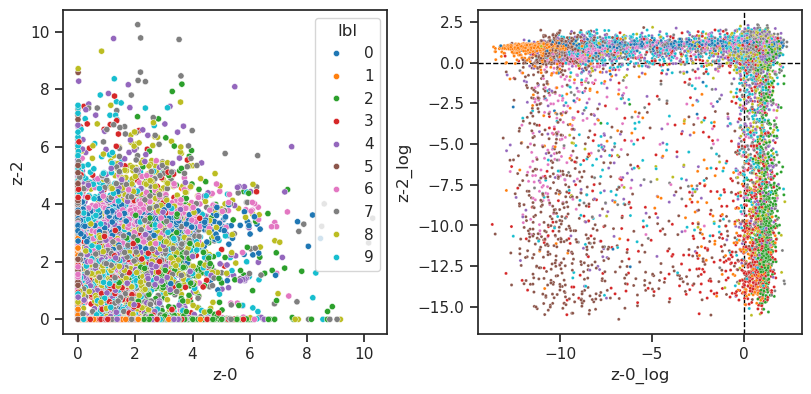

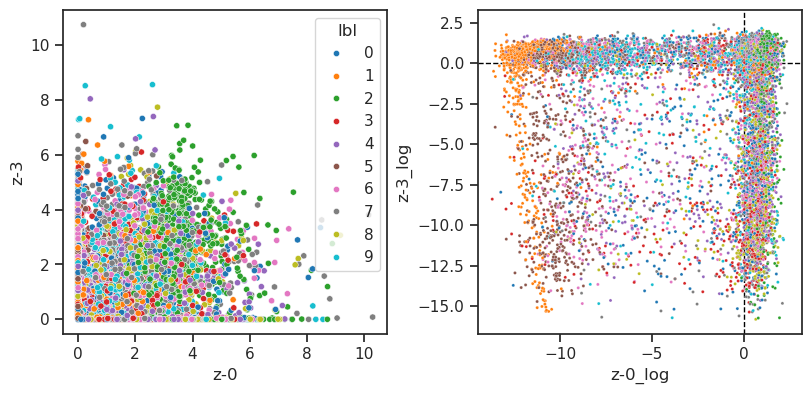

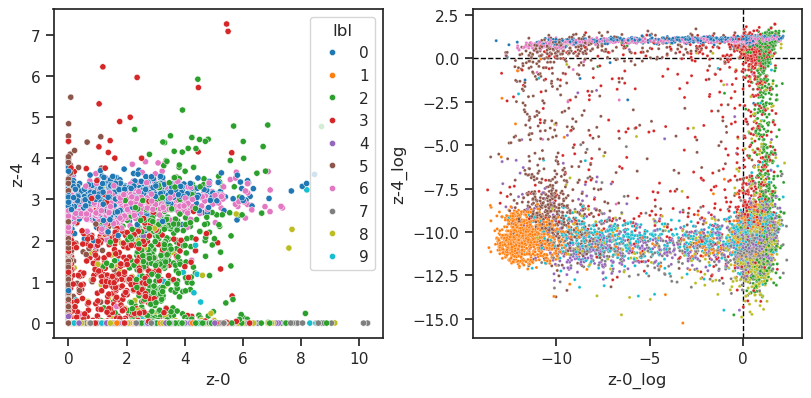

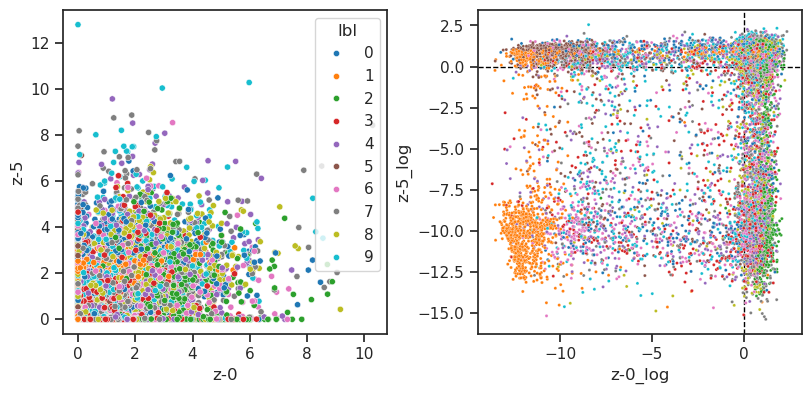

...

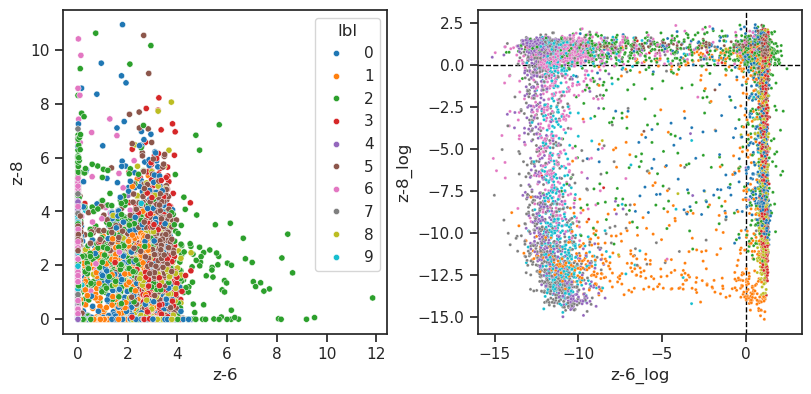

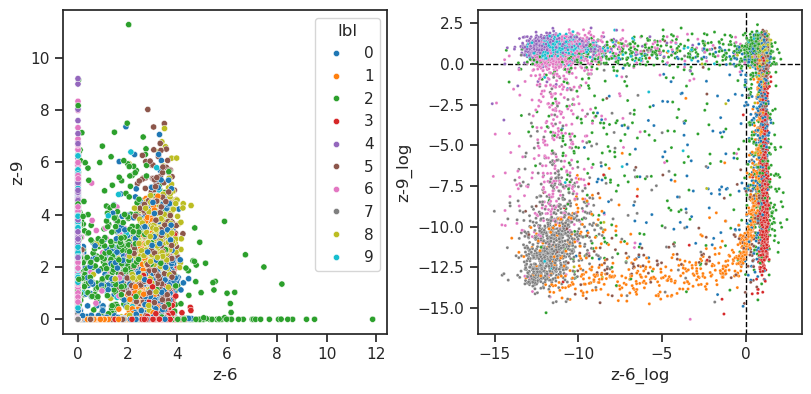

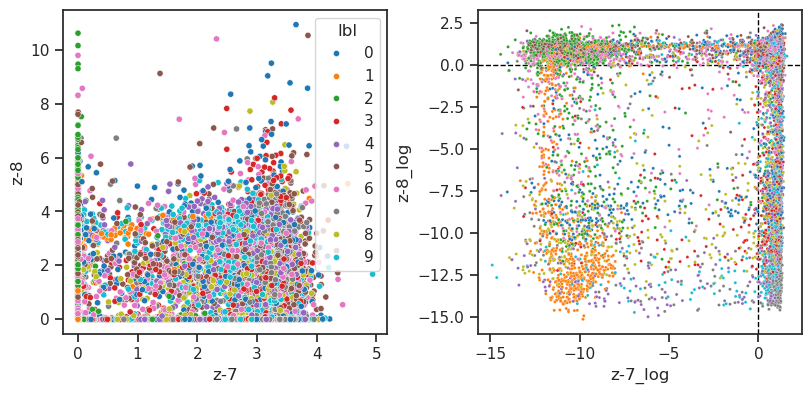

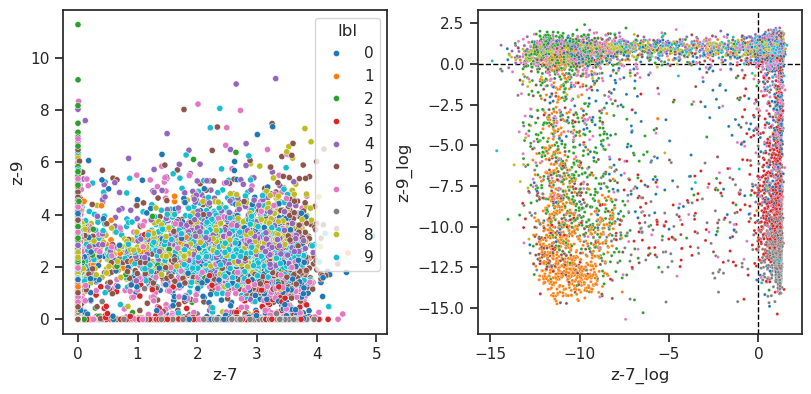

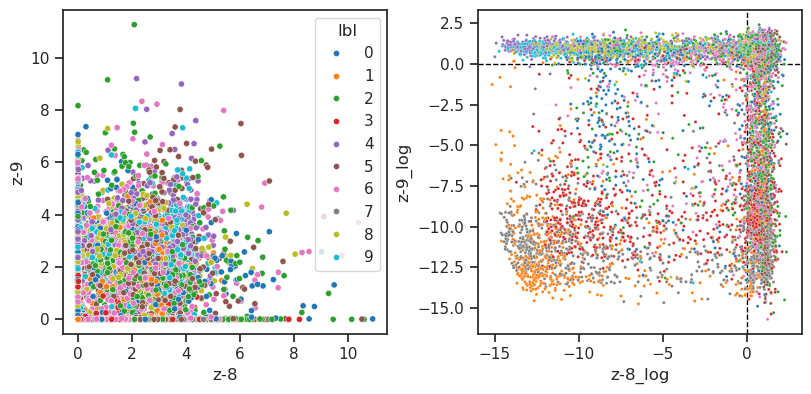

In [18]:
for i, j in list(itertools.combinations(
    range(tr.model.cfg.n_latents), 2)):
    _show_pairwise(i, j)

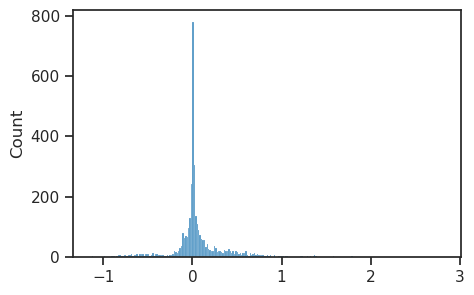

In [19]:
sns.histplot(to_np(torch.cat(vae.all_lognorm)));

In [20]:
(np.array(list(tr.stats['grad'].values())) > 500).sum() / len(tr.stats['grad']) * 100

0.8096296296296296

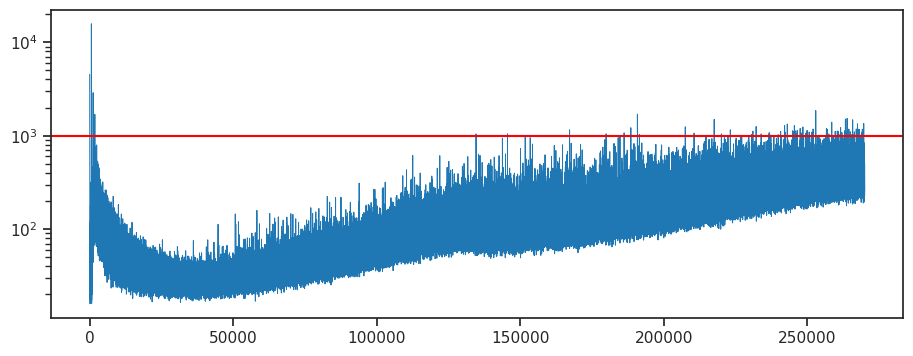

In [21]:
fig, ax = create_figure(1, 1, (11, 4))
plt.plot(tr.stats['grad'].keys(), tr.stats['grad'].values(), lw=0.7)
ax.axhline(tr.cfg.grad_clip, color='r')
ax.set(yscale='log')
plt.show()

In [22]:
df, df_summary = knn_analysis(
    x=etc['log_dr'],
    y=to_np(tr.dl_vld.dataset.tensors[1]),
    n_iter=100,
    verbose=True,
)

train sample size: 5000, iter #0: 100%|█████████████████| 801/801 [01:57<00:00,  6.83it/s]


In [23]:
df_summary

,mean,std
size,,
20,0.378758,0.057141
50,0.614966,0.052230
100,0.749866,0.024053
200,0.827404,0.021820
500,0.888018,0.011741
1000,0.918216,0.008281
2000,0.933424,0.004654
4000,0.941762,0.001525
5000,0.943000,NaN
